### Mice protein expression data set

This file uses the Mice protein expression data set provided by UCI to identify a subset of proteins that can successfully discriminate mice between eight subclasses.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.utils import shuffle
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import VarianceThreshold
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.model_selection import KFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

print('Libraries imported!')

Libraries imported!


In [2]:
mice_df = pd.read_csv('Data_Cortex_Nuclear.csv', sep = ',', header = 0)

In [3]:
# split the MouseID column into Mouse_ID and TestNo column to perform analysis on specific mouse
mice_df.insert(0, 'Mouse_ID', mice_df.MouseID.apply(lambda x: x.split('_')[0]))
mice_df.insert(1, 'TestNo', mice_df.MouseID.apply(lambda x: x.split('_')[1]))

# drop the MouseID column
mice_df.drop(['MouseID'], axis=1, inplace=True)

mice_df.head(5)

,Mouse_ID,TestNo,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,...,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class
0,309,1,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,...,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,Control,Memantine,C/S,c-CS-m
1,309,2,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,...,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,Control,Memantine,C/S,c-CS-m
2,309,3,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,...,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,Control,Memantine,C/S,c-CS-m
3,309,4,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,...,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,Control,Memantine,C/S,c-CS-m
4,309,5,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,...,0.110694,0.434154,0.118481,0.140314,0.148380,1.839730,Control,Memantine,C/S,c-CS-m


###### All the protein expression level columns are numerice and the rest 6 columns are stored as object

In [4]:
mice_df.dtypes.value_counts()

float64    77
object      6
dtype: int64

### Missing Values

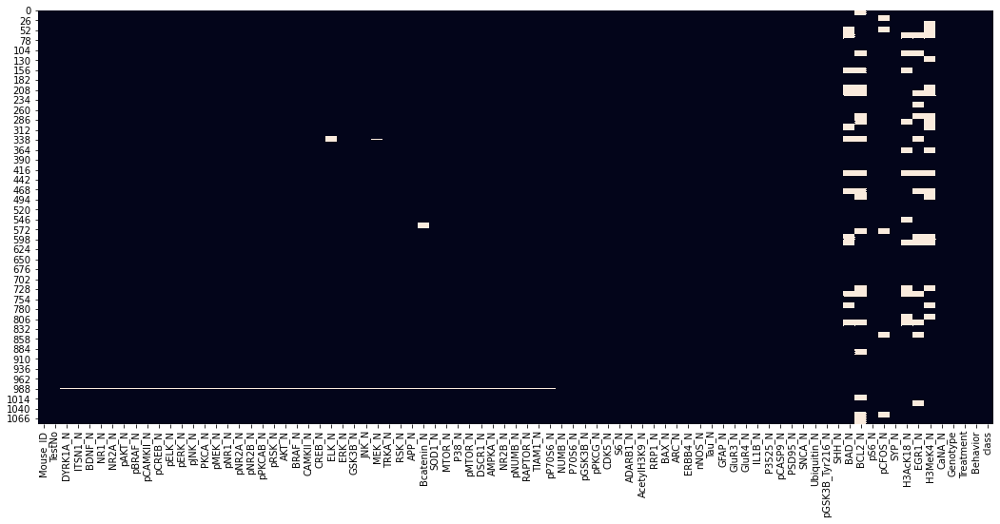

In [5]:
# plot the heat map to visualize the missing values in the dataset
fig, ax = plt.subplots(figsize=(18,8))
sns.heatmap(mice_df.isnull(), cbar=False)

##### Dropping few columns and rows containing NaNs

In [6]:
# Missing Values - Filter Strategy (to filter some fields containing higher no of missing values)
nan_count = mice_df.isnull().sum()
missing_value_threshold = 75

# filter columns having missing values >= 75
print("NaN counts: ")
for nan in nan_count:
    if nan >= 75:
        print(nan)

# dropping columns - 'BAD_N' 'BCL2_N' 'pCFOS_N' 'H3AcK18_N' 'EGR1_N' and 'H3MeK4_N'
to_remove_columns = nan_count.where(nan_count >= missing_value_threshold).dropna().index

# dropping columns
mice_df.drop(to_remove_columns, axis=1, inplace=True)
print('columns dropped: ', to_remove_columns.values)

NaN counts: 
213
285
75
180
210
270
columns dropped:  ['BAD_N' 'BCL2_N' 'pCFOS_N' 'H3AcK18_N' 'EGR1_N' 'H3MeK4_N']


##### Dropping few rows containg NaN values for majority of proteins

In [7]:
# the following three rows have NaN values for most of the protein expressions hence dropping them
print(mice_df[ mice_df['DYRK1A_N'].isnull()][mice_df.columns[2:10]])
mice_df.drop(mice_df[ mice_df['DYRK1A_N'].isnull()].index, axis = 0, inplace=True)

     DYRK1A_N  ITSN1_N  BDNF_N  NR1_N  NR2A_N  pAKT_N  pBRAF_N  pCAMKII_N
987       NaN      NaN     NaN    NaN     NaN     NaN      NaN        NaN
988       NaN      NaN     NaN    NaN     NaN     NaN      NaN        NaN
989       NaN      NaN     NaN    NaN     NaN     NaN      NaN        NaN


##### Imputing missing values for MEK_N, ELK_N AND Bcatenin_N with mean() of that 'class'

In [8]:
mice_df['MEK_N'].fillna(round(mice_df[mice_df['Mouse_ID'] == '3479']['MEK_N'].mean(), 6), inplace=True)

In [9]:
print(mice_df[mice_df['ELK_N'].isna()]['Mouse_ID'].unique())
print(mice_df[mice_df['Bcatenin_N'].isna()]['Mouse_ID'].unique())

mice_df['ELK_N'].fillna(round(mice_df[ mice_df['class'] == 'c-CS-s']['ELK_N'].mean(), 5), inplace=True)
mice_df['Bcatenin_N'].fillna(round(mice_df[ mice_df['class'] == 'c-CS-s']['Bcatenin_N'].mean(), 5), inplace=True)

['3479']
['J2292']


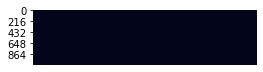

In [10]:
# all missing values have been handled
fig, ax = plt.subplots(figsize=(4,1))
sns.heatmap(mice_df.isnull(), cbar=False)
_ = ax.set_xticks([])

### Descriptive statistics

In [11]:
mice_df.describe()

,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,...,P3525_N,pCASP9_N,PSD95_N,SNCA_N,Ubiquitin_N,pGSK3B_Tyr216_N,SHH_N,pS6_N,SYP_N,CaNA_N
count,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,...,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000
mean,0.425810,0.617102,0.319088,2.297269,3.843934,0.233168,0.181846,3.537109,0.212574,1.428682,...,0.291197,1.548413,2.235409,0.159809,1.239272,0.848297,0.226754,0.121528,0.446149,1.337442
std,0.249362,0.251640,0.049383,0.347293,0.933100,0.041634,0.027042,1.295169,0.032587,0.466904,...,0.030019,0.248458,0.254723,0.024182,0.173816,0.094009,0.028991,0.014295,0.066507,0.317499
min,0.145327,0.245359,0.115181,1.330831,1.737540,0.063236,0.064043,1.343998,0.112812,0.429032,...,0.207438,0.853176,1.206098,0.101233,0.750664,0.577397,0.155869,0.067254,0.258626,0.586479
25%,0.288121,0.473361,0.287444,2.057411,3.155678,0.205755,0.164595,2.479834,0.190823,1.203665,...,0.269981,1.374922,2.079042,0.142824,1.115915,0.793711,0.206505,0.110793,0.398036,1.081231
50%,0.366378,0.565782,0.316564,2.296546,3.760855,0.231177,0.182302,3.326520,0.210594,1.355846,...,0.290548,1.522698,2.243043,0.157493,1.237059,0.849398,0.224074,0.121627,0.448585,1.316591
75%,0.487711,0.698032,0.348197,2.528481,4.440011,0.257261,0.197418,4.481940,0.234595,1.561316,...,0.311460,1.713334,2.420306,0.173308,1.363284,0.915400,0.241687,0.131989,0.490805,1.585916
max,2.516367,2.602662,0.497160,3.757641,8.482553,0.539050,0.317066,7.464070,0.306247,6.113347,...,0.443735,2.586216,2.877873,0.257616,1.897202,1.204598,0.358289,0.158748,0.759588,2.129791


### Data Exploration

In [12]:
# select numeric columns (i.e protein expressions - 77 columns)
protein_cols = mice_df.select_dtypes(include='number').columns

# colors for plotting the scatter plots
protein_colors = ["#83CBF1","#1E24DF", '#A8EA98', '#329E18', "#E983F1", "#F22510", "#E8C37E", "#E4952F"]

#### Protein expression levels exploration

##### Count of each subclasses of mice

Text(0.5, 1.0, 'Count of each mice class')

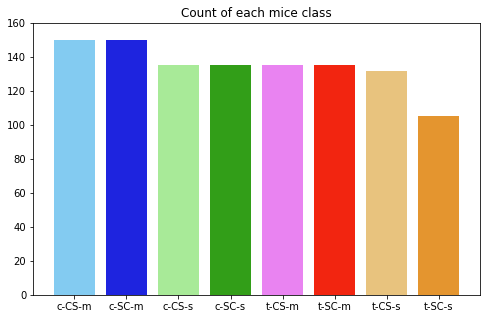

In [13]:
f, axes = plt.subplots(1, 1, figsize=(8, 5))
axes.bar(mice_df['class'].unique(), mice_df['class'].value_counts(), color = protein_colors)
plt.ylim(top=160)
plt.title("Count of each mice class")

##### Violin plots of columns showing outliers and their distribution

Text(0, 0.5, 'AcetylH3K9_N')

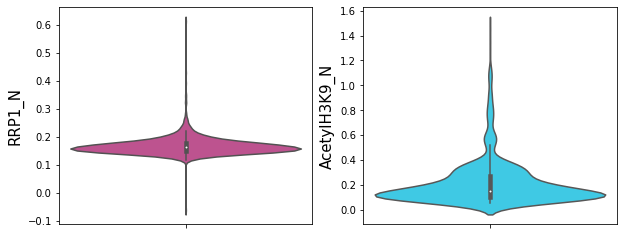

In [14]:
f, axes = plt.subplots(1, 2, figsize=(10, 4))
data = "RRP1_N"
sns.violinplot(y=mice_df[data], ax=axes[0], palette=sns.color_palette('PiYG'))
axes[0].set_ylabel(data,fontsize=15)

data = "AcetylH3K9_N"
sns.violinplot(y=mice_df[data], ax=axes[1], palette=sns.color_palette('cool'))
axes[1].set_ylabel(data,fontsize=15)

##### Violin plots of columns with lowest variance

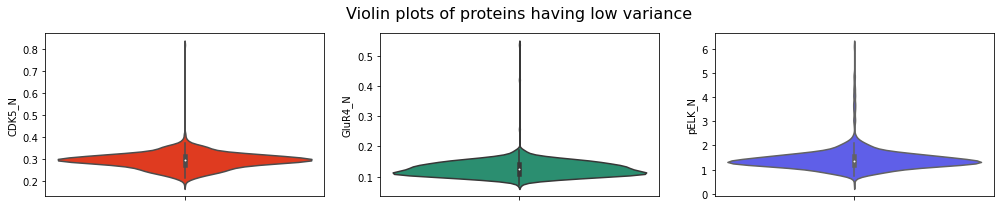

In [15]:
f, axes = plt.subplots(1, 3, figsize=(17, 3))

data = "CDK5_N"
sns.violinplot(y=mice_df[data], ax=axes[0], palette=sns.color_palette('autumn'))

data = "GluR4_N"
sns.violinplot(y=mice_df[data], ax=axes[1], palette=sns.color_palette('Dark2'))
axes[1].set_title("Violin plots of proteins having low variance", fontsize=16, pad = 15)

data = "pELK_N"
sns.violinplot(y=mice_df[data], ax=axes[2], palette=sns.color_palette('bwr'))

##### Violin plots of columns with high variance

Text(0, 0.5, 'CaNA_N')

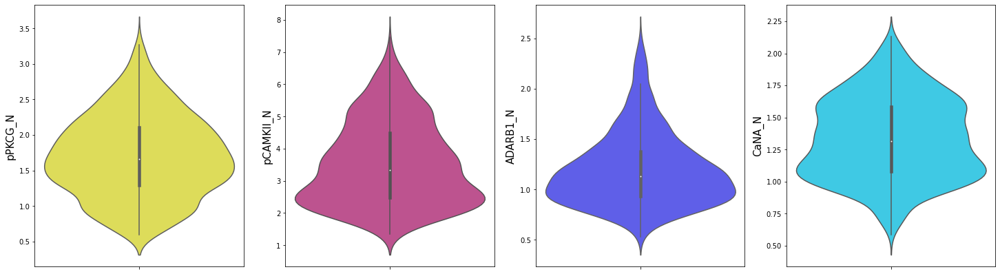

In [16]:
f, axes = plt.subplots(1, 4, figsize=(25, 7))

data = "pPKCG_N"
sns.violinplot(y=mice_df[data], ax=axes[0], palette=sns.color_palette('Wistia'))
axes[0].set_ylabel(data,fontsize=15)

data = "pCAMKII_N"
sns.violinplot(y=mice_df[data], ax=axes[1], palette=sns.color_palette('PiYG'))
axes[1].set_ylabel(data,fontsize=15)

data = "ADARB1_N"
sns.violinplot(y=mice_df[data], ax=axes[2], palette=sns.color_palette('bwr'))
axes[2].set_ylabel(data,fontsize=15)

data = "CaNA_N"
sns.violinplot(y=mice_df[data], ax=axes[3], palette=sns.color_palette('cool'))
axes[3].set_ylabel(data,fontsize=15)

##### The following two cells of code shows the violin plots of all 72 proteins to analyse the distribution and spread of data (few columns were dropped containing high values of NAs)
NOTE: Double click on left side bar to expand the area and double click on plot to zoom it

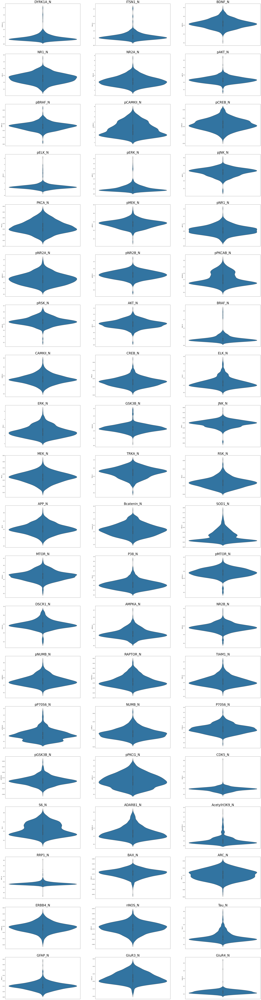

In [17]:
# reshape the array to convert it into 2-d 20X3 array containing first 60 proteins
protein_arr = np.reshape(protein_cols[0:60], (20,3))

# plot first 60 proteins using violin plots
f, axes = plt.subplots(20, 3, figsize=(50, 200))

for i, protein_row in enumerate(protein_arr):
    for j, protein in enumerate(protein_row):
        sns.violinplot(y=mice_df[protein], ax=axes[i][j])
        axes[i][j].set_title(protein, fontsize = 35)

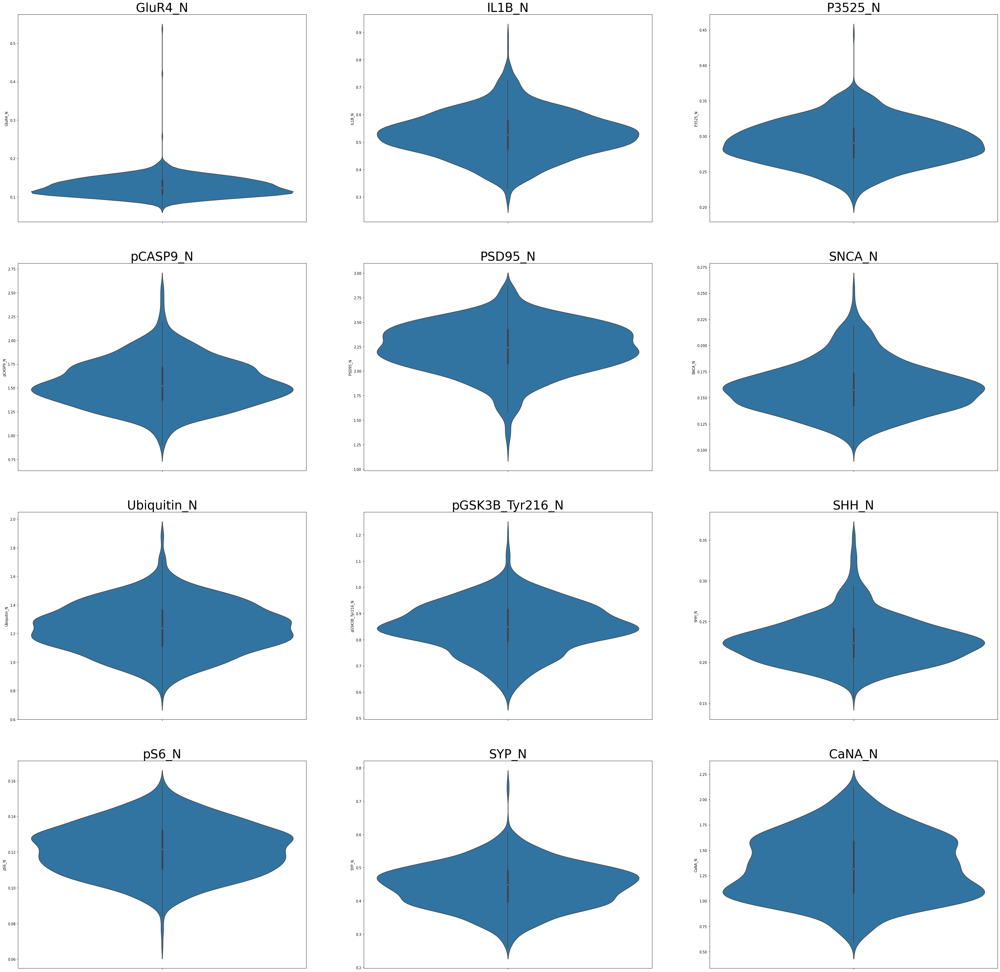

In [18]:
# plot remaining proteins (71 proteins are considered as few columns containing NAs are dropped)
protein_arr = np.reshape(protein_cols[59:72], (4,3))
f, axes = plt.subplots(4, 3, figsize=(50, 50))

for i, protein_row in enumerate(protein_arr):
    for j, protein in enumerate(protein_row):
        sns.violinplot(y=mice_df[protein], ax=axes[i][j])
        axes[i][j].set_title(protein, fontsize = 35)

##### Some mice protein expression levels act as an outliers. Below box plot shows that mice with id 3484 has high DYKR1A_N and pERK_N levels as compared to other mice of the same sub class 'c-CS-s'

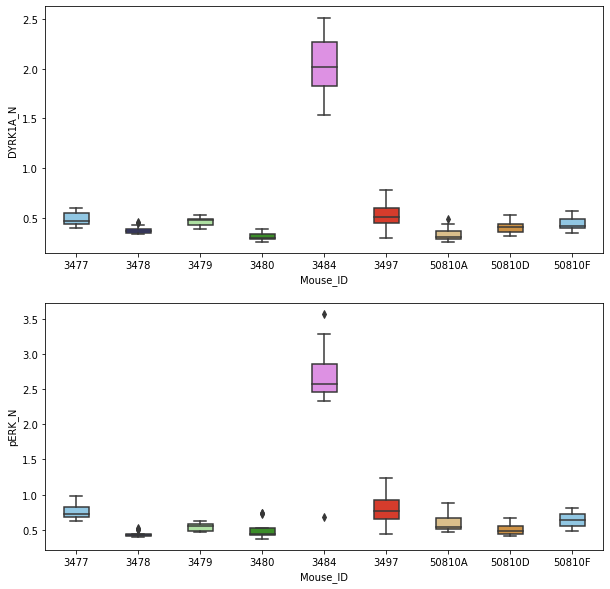

In [19]:
f, axes = plt.subplots(2, 1, figsize=(10, 10))
data="DYRK1A_N"
sns.boxplot(x="Mouse_ID", y=data, palette=sns.color_palette(protein_colors), data=mice_df[mice_df['class'] == 'c-CS-s'], ax=axes[0], width = 0.4)

data="pERK_N"
sns.boxplot(x="Mouse_ID", y=data, palette=sns.color_palette(protein_colors), data=mice_df[mice_df['class'] == 'c-CS-s'], ax=axes[1], width = 0.4)

#### Exploration to find relationship between proteins

##### The following two cells of code shows the relationship between class and SOD1_N and pPKCG_N proteins

Text(0.5, 1.0, 'Box plot of SOD1_N and class')

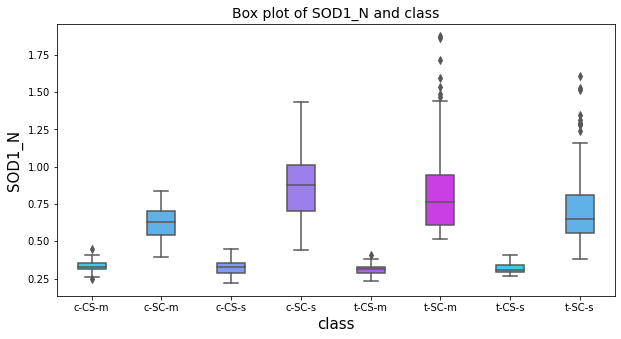

In [20]:
f, axes = plt.subplots(1, 1, figsize=(10, 5))

x_data = "class"
y_data="SOD1_N"

sns.boxplot(x=x_data, y=y_data, palette=sns.color_palette('cool'), data=mice_df, ax=axes, width = 0.4)

axes.set_xlabel(x_data,fontsize=15)
axes.set_ylabel(y_data,fontsize=15)

axes.set_title('Box plot of SOD1_N and class', fontsize = 14)

Text(0.5, 1.0, 'Box plot of pPKCG_N and class')

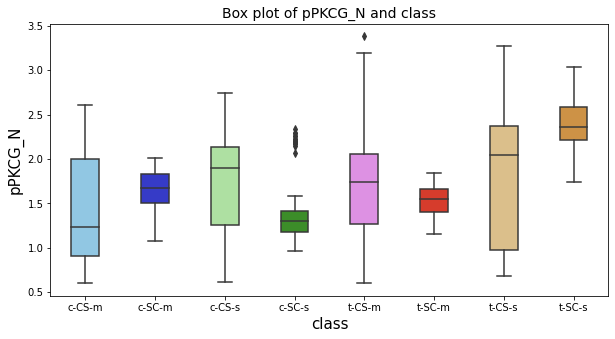

In [21]:
f, axes = plt.subplots(1, 1, figsize=(10, 5))

x_data = "class"
y_data="pPKCG_N"

sns.boxplot(x=x_data, y=y_data, palette=sns.color_palette(protein_colors), data=mice_df, ax=axes, width = 0.4)

axes.set_xlabel(x_data,fontsize=15)
axes.set_ylabel(y_data,fontsize=15)

axes.set_title('Box plot of pPKCG_N and class', fontsize = 14)

##### Relationship between Behavior and proteins CaNA_N and pCAKII_N

Text(0.5, 1.0, 'Box plot of pCAMKII_N and Behavior')

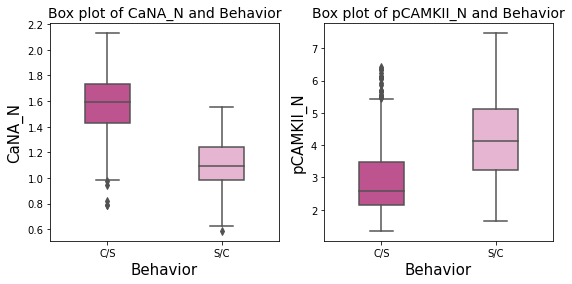

In [22]:
f, axes = plt.subplots(1, 2, figsize=(9, 4))

x_data = "Behavior"
y_data="CaNA_N"

sns.boxplot(x=x_data, y=y_data, palette=sns.color_palette('PiYG'), data=mice_df, ax=axes[0], width = 0.4)

axes[0].set_xlabel(x_data,fontsize=15)
axes[0].set_ylabel(y_data,fontsize=15)
axes[0].set_title('Box plot of CaNA_N and Behavior', fontsize = 14)

x_data = "Behavior"
y_data="pCAMKII_N"

sns.boxplot(x=x_data, y=y_data, palette=sns.color_palette('PiYG'), data=mice_df, ax=axes[1], width = 0.4)

axes[1].set_xlabel(x_data,fontsize=15)
axes[1].set_ylabel(y_data,fontsize=15)
axes[1].set_title('Box plot of pCAMKII_N and Behavior', fontsize = 14)

##### Relationship between Genotype and proteins AcetlyH3K9_N and APP_N

Text(0.5, 1.0, 'Box plot of APP_N and Genotype')

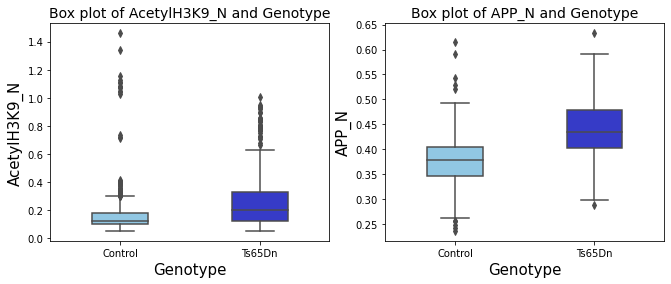

In [23]:
f, axes = plt.subplots(1, 2, figsize=(11, 4))

x_data = "Genotype"
y_data="AcetylH3K9_N"
sns.boxplot(x=x_data, y=y_data, palette=sns.color_palette(protein_colors), data=mice_df, ax=axes[0], width = 0.4)

axes[0].set_xlabel(x_data,fontsize=15)
axes[0].set_ylabel(y_data,fontsize=15)
axes[0].set_title('Box plot of AcetylH3K9_N and Genotype', fontsize = 14)

x_data = "Genotype"
y_data="APP_N"
sns.boxplot(x=x_data, y=y_data, palette=sns.color_palette(protein_colors), data=mice_df, ax=axes[1], width = 0.4)

axes[1].set_xlabel(x_data,fontsize=15)
axes[1].set_ylabel(y_data,fontsize=15)
axes[1].set_title('Box plot of APP_N and Genotype', fontsize = 14)

##### The following cells plots scatter plots for all the proteins pair wise (grouped by class) to any patterns or interesting relationship between them

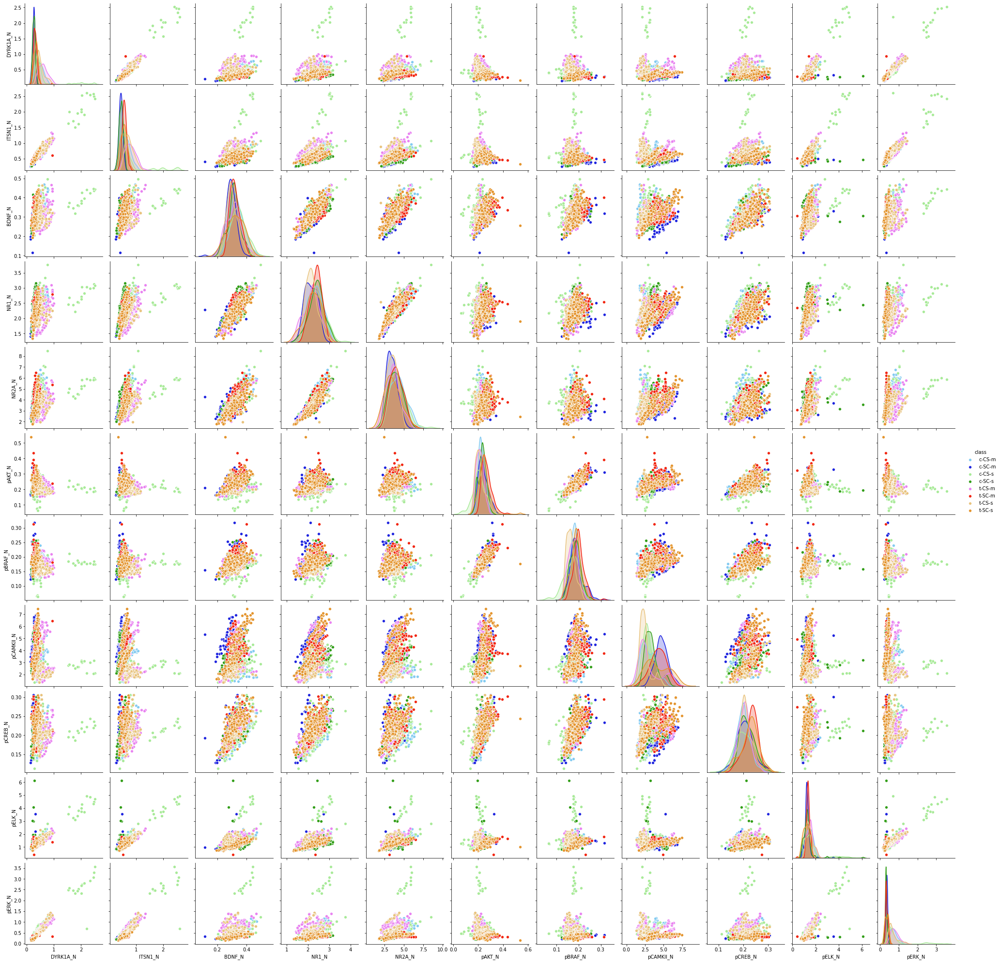

In [24]:
scatter_df = mice_df[protein_cols[:11]].copy()
scatter_df['class'] = mice_df['class']
sns.pairplot(scatter_df, hue='class', palette = sns.color_palette(protein_colors))

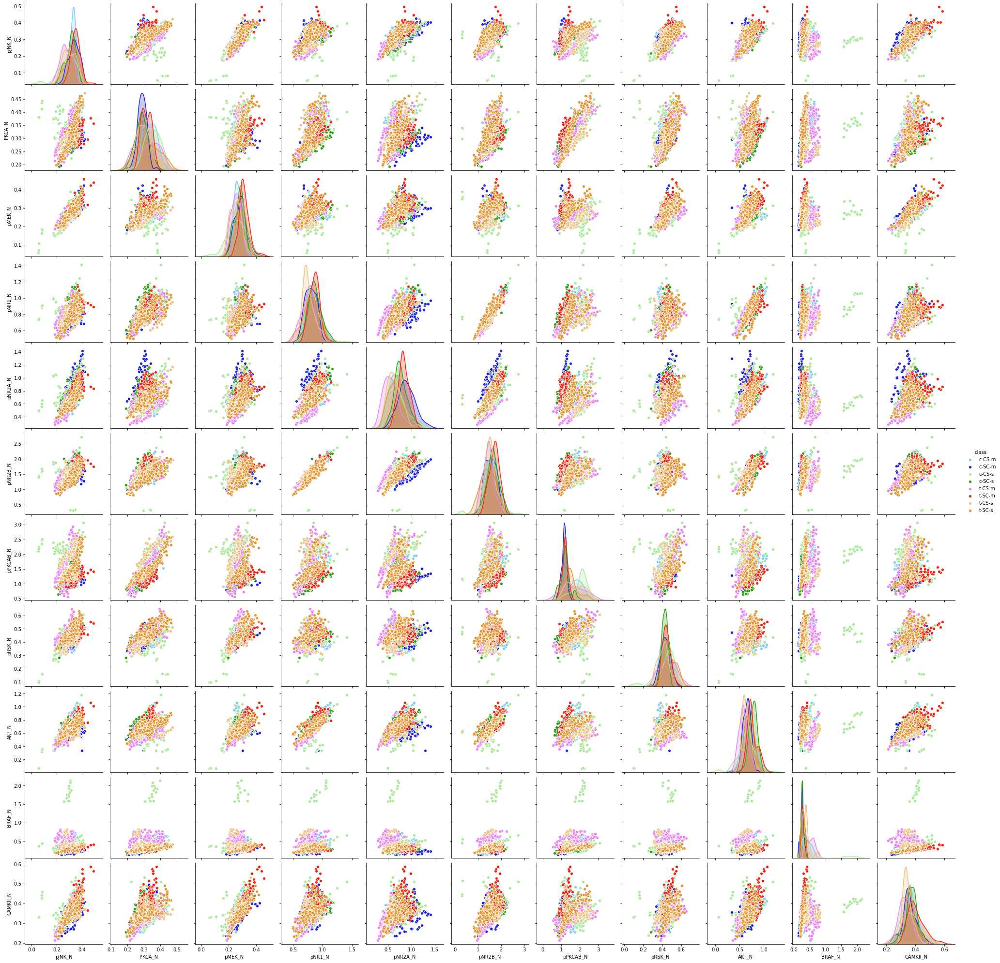

In [25]:
scatter_df = mice_df[protein_cols[11:22]].copy()
scatter_df['class'] = mice_df['class']
sns.pairplot(scatter_df, hue='class', palette = sns.color_palette(protein_colors))

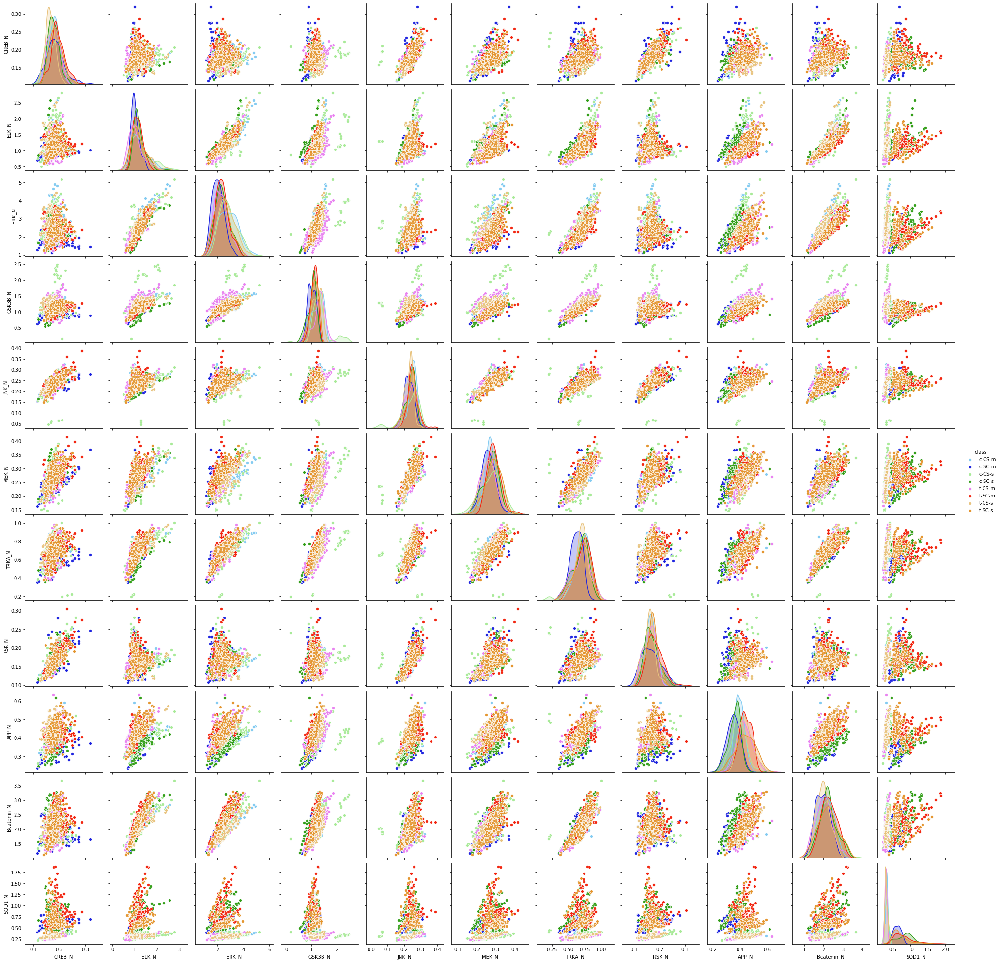

In [26]:
scatter_df = mice_df[protein_cols[22:33]].copy()
scatter_df['class'] = mice_df['class']
sns.pairplot(scatter_df, hue='class', palette = sns.color_palette(protein_colors))

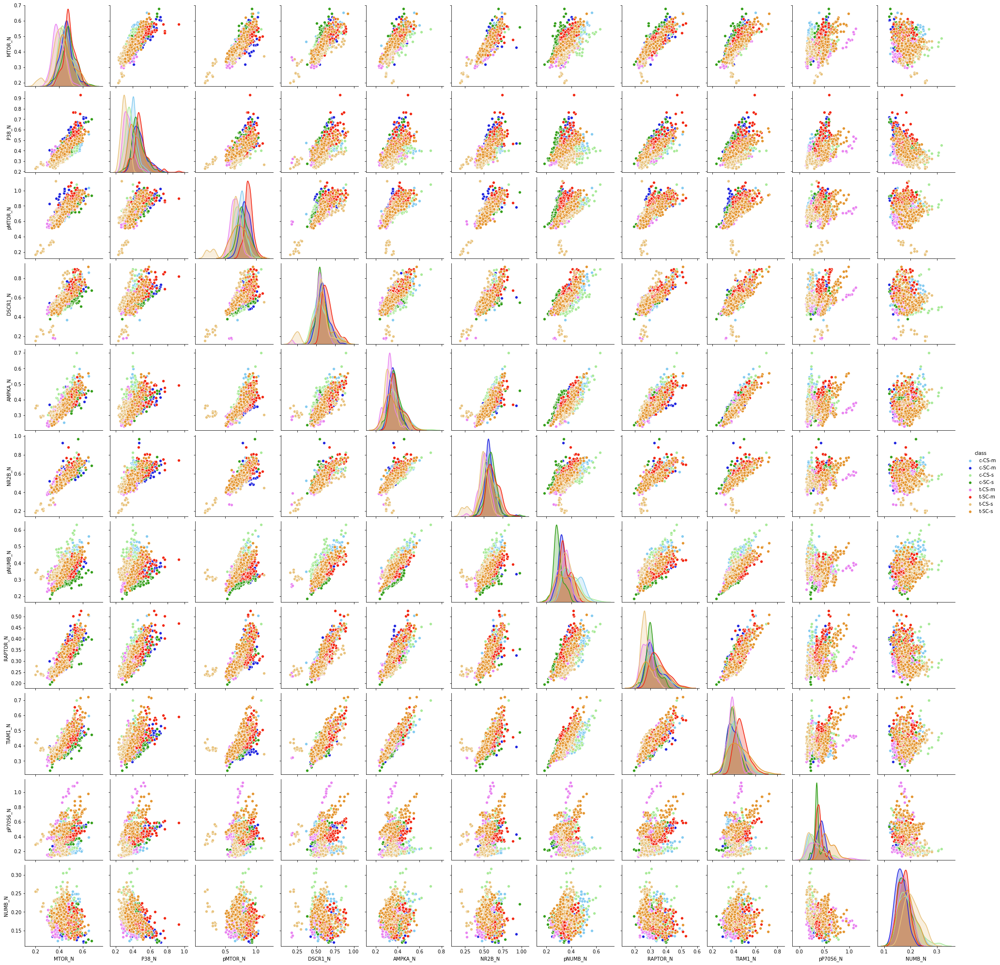

In [27]:
scatter_df = mice_df[protein_cols[33:44]].copy()
scatter_df['class'] = mice_df['class']
sns.pairplot(scatter_df, hue='class', palette = sns.color_palette(protein_colors))

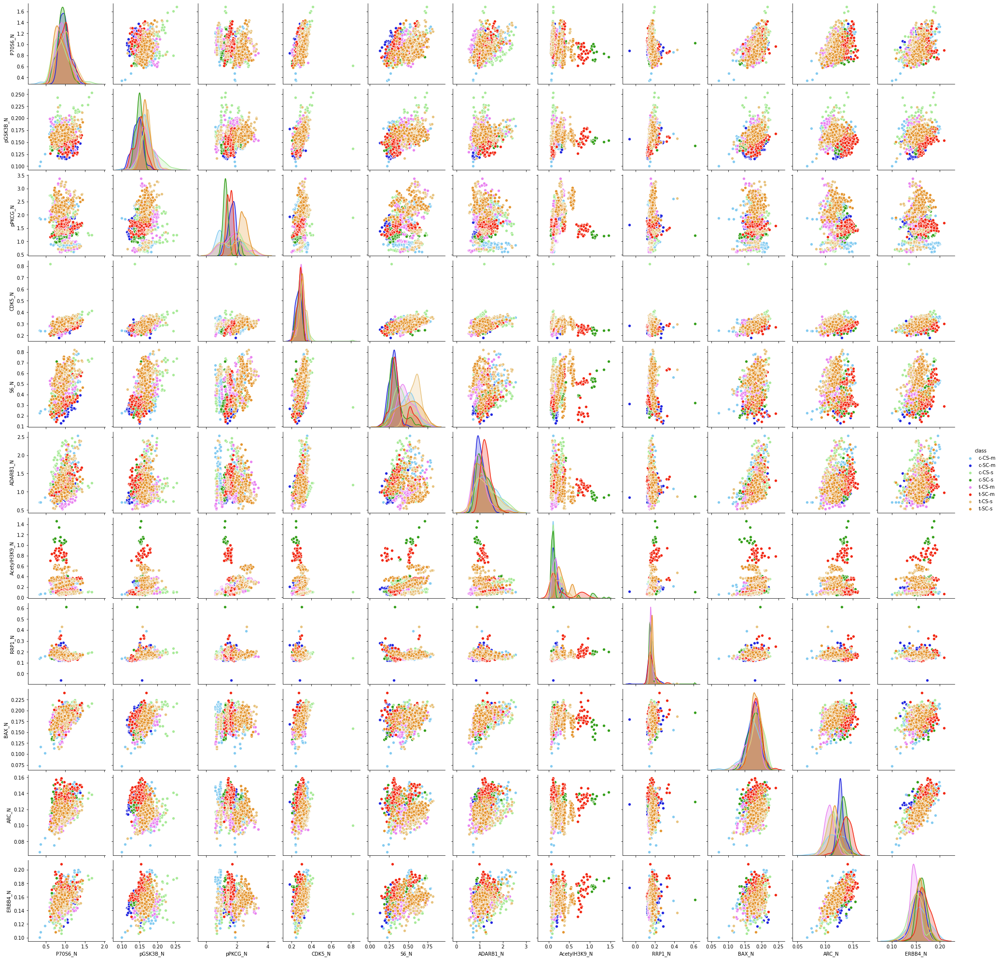

In [28]:
scatter_df = mice_df[protein_cols[44:55]].copy()
scatter_df['class'] = mice_df['class']
sns.pairplot(scatter_df, hue='class', palette = sns.color_palette(protein_colors))

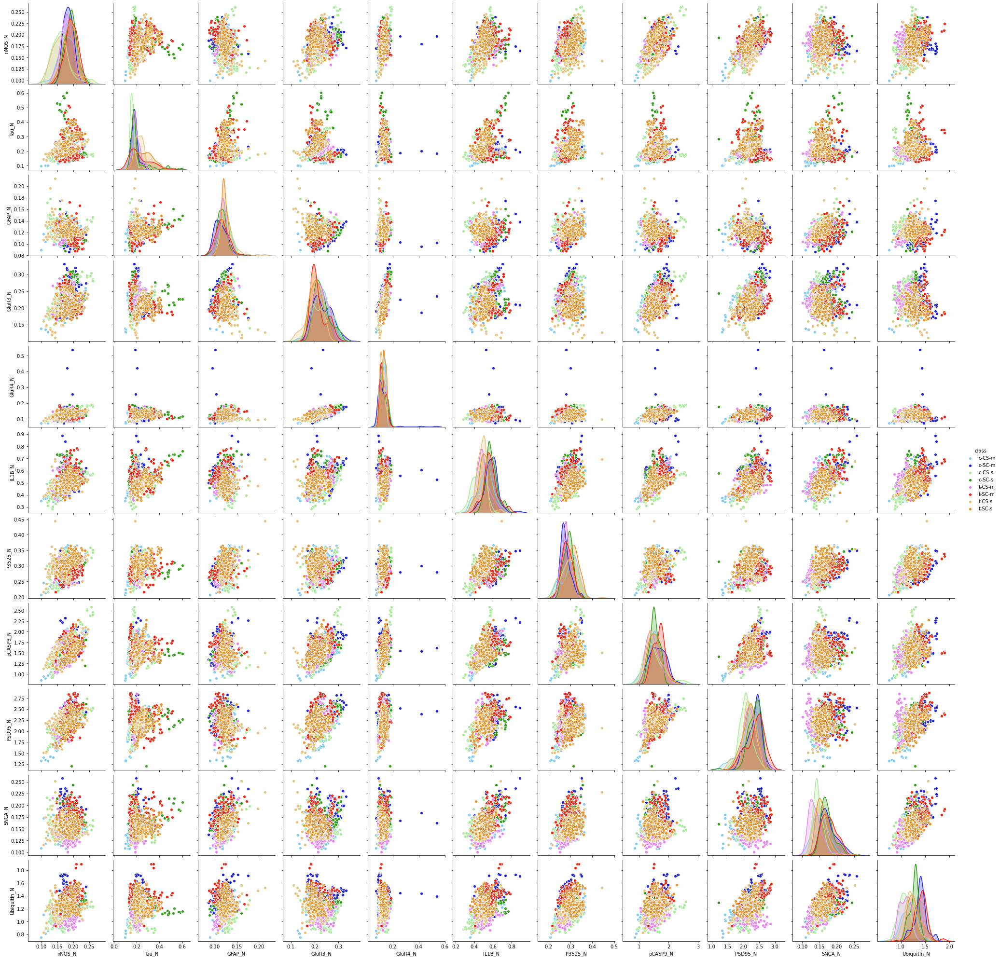

In [29]:
scatter_df = mice_df[protein_cols[55:66]].copy()
scatter_df['class'] = mice_df['class']
sns.pairplot(scatter_df, hue='class', palette = sns.color_palette(protein_colors))

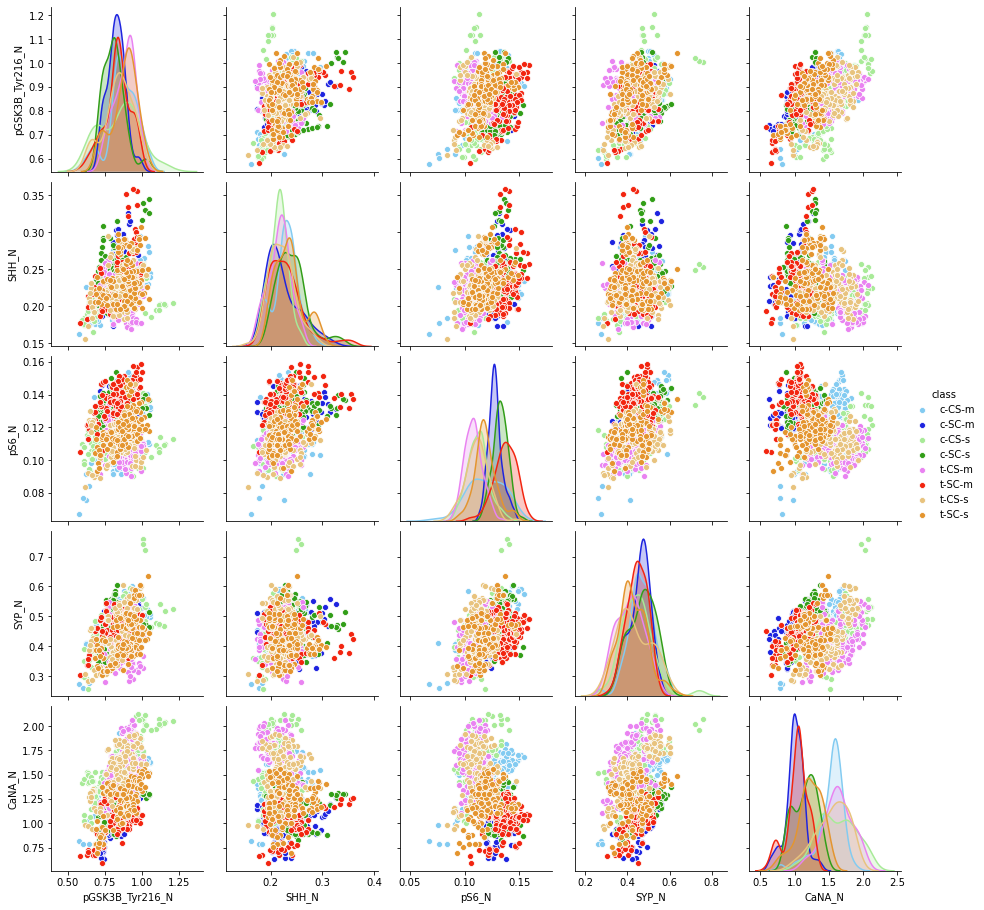

In [30]:
scatter_df = mice_df[protein_cols[66:71]].copy()
scatter_df['class'] = mice_df['class']
sns.pairplot(scatter_df, hue='class', palette = sns.color_palette(protein_colors))

##### The following cells visualize box plots for all the proteins grouped by class which is the target variable to find any interesting insights

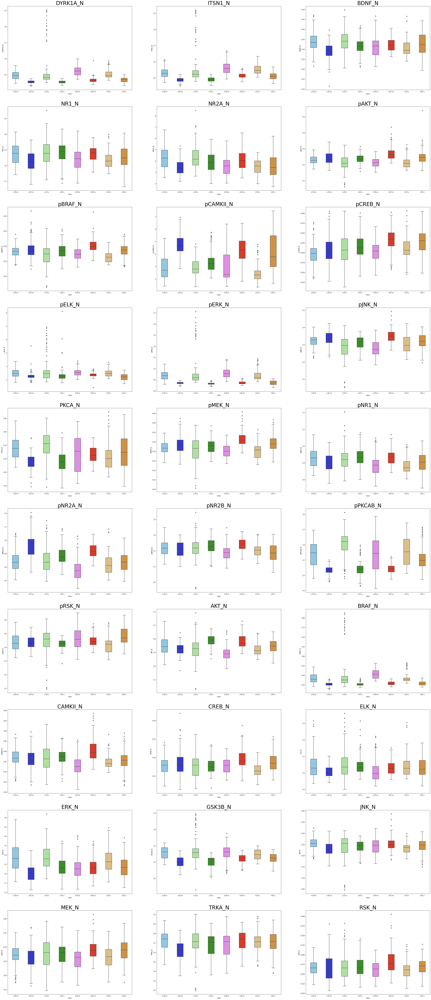

In [31]:
protein_arr = np.reshape(protein_cols[0:30], (10,3))
f, axes = plt.subplots(10, 3, figsize=(50, 120))

for i, protein_row in enumerate(protein_arr):
    for j, protein in enumerate(protein_row):
        sns.boxplot(x="class", y=protein, palette=sns.color_palette(protein_colors), data=mice_df, ax=axes[i][j], width = 0.4)
        axes[i][j].set_title(protein, fontsize = 35)

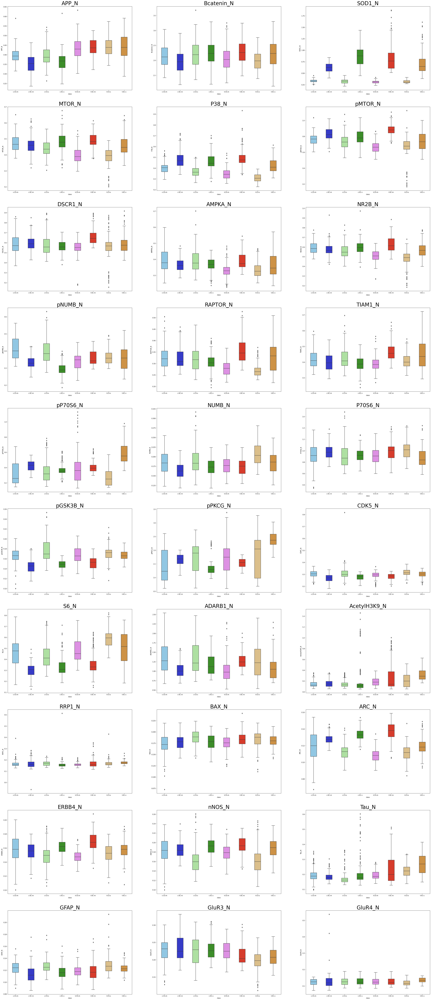

In [32]:
protein_arr = np.reshape(protein_cols[30:60], (10,3))
f, axes = plt.subplots(10, 3, figsize=(50, 120))

for i, protein_row in enumerate(protein_arr):
    for j, protein in enumerate(protein_row):
        sns.boxplot(x="class", y=protein, palette=sns.color_palette(protein_colors), data=mice_df, ax=axes[i][j], width = 0.4)
        axes[i][j].set_title(protein, fontsize = 35)

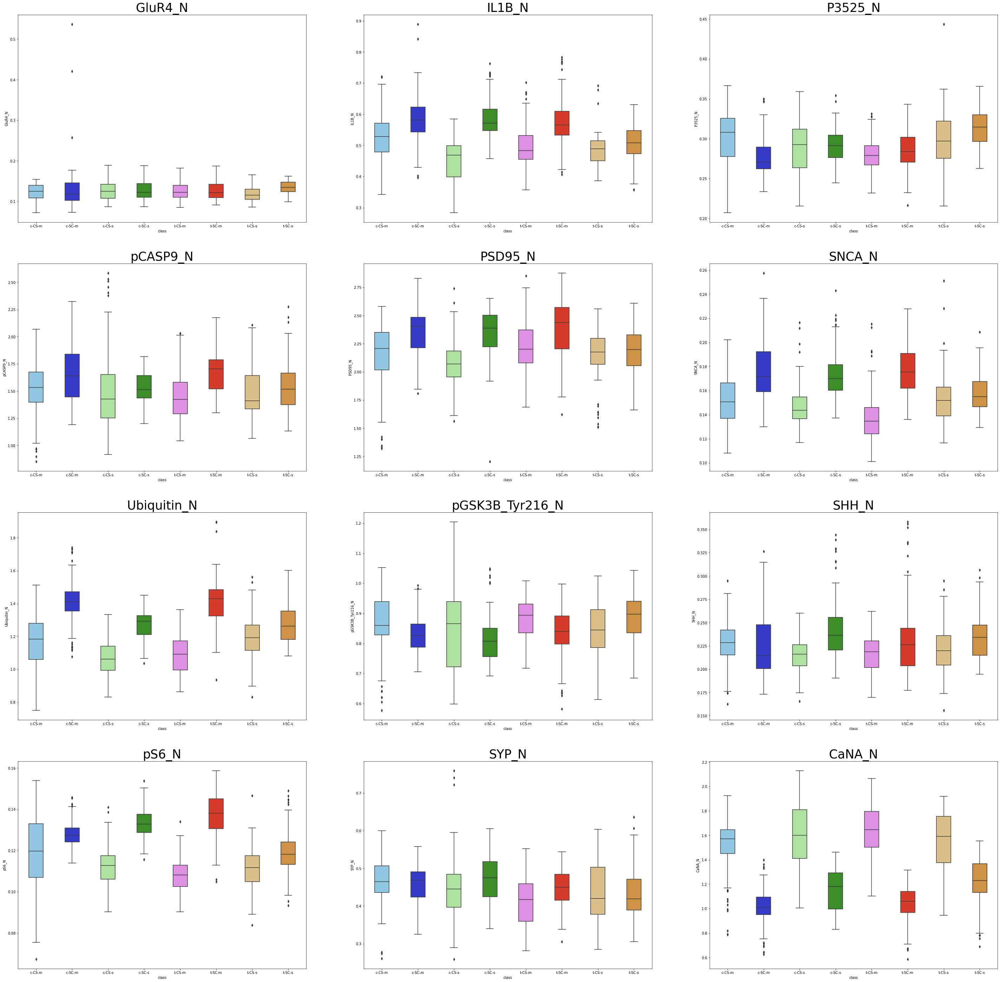

In [33]:
protein_arr = np.reshape(protein_cols[59:78], (4,3))
f, axes = plt.subplots(4, 3, figsize=(50, 50))

for i, protein_row in enumerate(protein_arr):
    for j, protein in enumerate(protein_row):
        sns.boxplot(x="class", y=protein, palette=sns.color_palette(protein_colors), data=mice_df, ax=axes[i][j], width = 0.4)
        axes[i][j].set_title(protein, fontsize = 35)

### Feature Selection

##### Low Variance Filter - Filter Strategy (to filter some fields with lower variance than some threshold value)

Following low variance Protein expression columns dropped:  ['pAKT_N' 'pELK_N' 'JNK_N' 'CDK5_N' 'RRP1_N' 'GluR4_N']


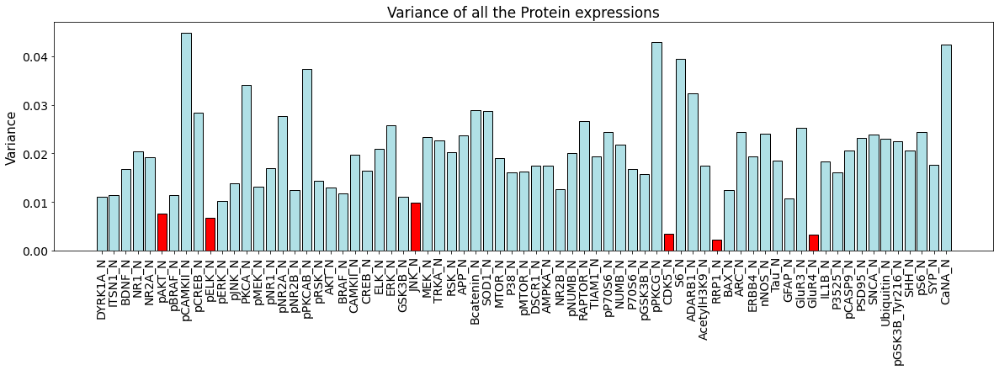

In [34]:
numeric_cols = mice_df.select_dtypes(include='number').columns

# create and object of MinMaxScaler() to standardize/normalise the data, so that all values are in range [0, 1]
min_max_scaler = MinMaxScaler()

# normalised dataset with only numeric columns
df_standard = pd.DataFrame(min_max_scaler.fit_transform(mice_df[numeric_cols]), columns=numeric_cols)

# variance thershold to select features with threshold greater than 0.01
var_threshold=0.01

# create an object of VarianceTheshold to select the features
selector = VarianceThreshold(threshold=var_threshold)
selector.fit_transform(df_standard)

# selector will return true if the variance is greater than 0.01 else false
var_mask = selector.get_support()

# select the columns having low variance
to_remove_num_columns = df_standard.loc[:, ~var_mask].columns

# drop the columns with low variance
mice_df.drop(to_remove_num_columns, axis=1, inplace=True)

print('Following low variance Protein expression columns dropped: ', to_remove_num_columns.values)

# plot a bar chart visualising the variance for all the features
column_names = df_standard.columns
variance_data = df_standard.var()

# assign red color to features having variance less than threshold
colors = ['powderblue' if var > 0.01 else 'red' for var in variance_data]

# plot the variance of proteins using bar chart
fig, ax = plt.subplots(1,1,figsize = (20,5))

ax.bar(column_names, variance_data, color=colors, edgecolor='black')
ax.tick_params(axis='x', rotation=90)
ax.tick_params(axis='both', labelsize=14)
ax.set_title("Variance of all the Protein expressions", fontsize=17)
ax.set_ylabel("Variance", fontsize=15)

plt.show()

##### Wrapper Strategy (to remove low scoring features corresponding to target feature using feature importances)

Following columns dropped due to low feature importance: ['NUMB_N', 'ERBB4_N', 'SYP_N', 'pJNK_N', 'TIAM1_N', 'SHH_N', 'pRSK_N', 'pCASP9_N', 'GFAP_N', 'GluR3_N', 'GSK3B_N', 'PSD95_N', 'ERK_N', 'pCREB_N', 'pGSK3B_Tyr216_N', 'pNR1_N', 'BAX_N', 'pBRAF_N', 'TRKA_N', 'pMEK_N', 'ELK_N', 'NR1_N', 'NR2A_N', 'CREB_N', 'BDNF_N', 'pNR2B_N', 'P70S6_N', 'Bcatenin_N', 'RSK_N', 'MEK_N']


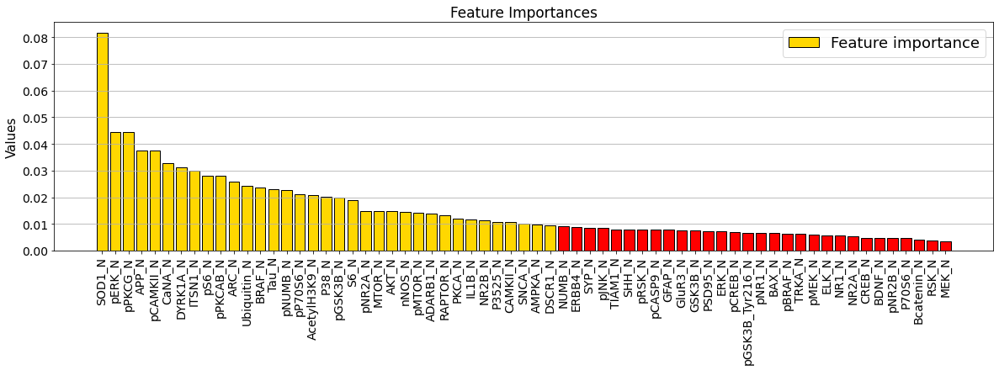

In [35]:
# input data and target attribute
numerical_df = pd.DataFrame(mice_df.select_dtypes(include='number'))
X = numerical_df
y = mice_df['class']

# feature selection using tree-based model - ExtraTreesClassifier 
# trying various values for n_estimators and max_depth, 100 and 7 appeared to be best fit 
model = RandomForestClassifier(n_estimators=100, max_depth=7, random_state=7)
model.fit(X, y)

# creating tuple containing column names and feature importance score
feature_importances = [(numerical_df.columns[i], round(value, 5)) for i, value in enumerate(model.feature_importances_)]

# sorting feature importance based on importance values
feature_importances.sort(key = lambda x: x[1], reverse=True)

# store last 30 column names having feature importance score below 0.1 and drop them
to_remove_columns = [col for col, value in feature_importances[-30:]]
mice_df.drop(to_remove_columns, axis=1, inplace=True)

print('Following columns dropped due to low feature importance:', to_remove_columns)

# plotting feature importances for each fields
column_names = [col for col, value in feature_importances]
data = [value for col, value in feature_importances]

# assign red color to columns having low feature importance
colors = ['red' if col in to_remove_columns else 'gold' for col, value in feature_importances]

fig, ax = plt.subplots(1,1,figsize = (20,5))
ax.bar(column_names, data,label= 'Feature importance', color=colors, edgecolor='black')
ax.tick_params(axis='x', rotation=90)
ax.tick_params(axis='both', labelsize=14)
ax.set_title("Feature Importances", fontsize=17)
ax.set_ylabel("Values", fontsize=15)

plt.grid(axis='y')
plt.legend(prop= {'size':18})
plt.show()

##### After applying filter strategy features are reduced to 35

In [36]:
print("After applying filter strategies total no of features are: {0}".format(len(mice_df.select_dtypes(include='number').columns)))

print("\nProtein columns to consider for data modelling are: {0}".format(mice_df.select_dtypes(include='number').columns.tolist()))

After applying filter strategies total no of features are: 35

Protein columns to consider for data modelling are: ['DYRK1A_N', 'ITSN1_N', 'pCAMKII_N', 'pERK_N', 'PKCA_N', 'pNR2A_N', 'pPKCAB_N', 'AKT_N', 'BRAF_N', 'CAMKII_N', 'APP_N', 'SOD1_N', 'MTOR_N', 'P38_N', 'pMTOR_N', 'DSCR1_N', 'AMPKA_N', 'NR2B_N', 'pNUMB_N', 'RAPTOR_N', 'pP70S6_N', 'pGSK3B_N', 'pPKCG_N', 'S6_N', 'ADARB1_N', 'AcetylH3K9_N', 'ARC_N', 'nNOS_N', 'Tau_N', 'IL1B_N', 'P3525_N', 'SNCA_N', 'Ubiquitin_N', 'pS6_N', 'CaNA_N']


In [37]:
# function to plot the confusion matrix 

def plot_confusion_matrix(true, pred, model_name):
    """
    Function to plot the confusion matrix
    
    true: Indicates the true values
    pred: Indicates the predicted values
    model_name: Name of the model
    """
    cm = confusion_matrix(true, pred)
    
    # visualizing the confusion matrix using heatmap
    fig,ax = plt.subplots(figsize=(4,4))
    sns.heatmap(cm,annot=True, linecolor="black", fmt=".0f", ax=ax)
    plt.xlabel("Predicted value")
    plt.ylabel("Truth value")
    plt.title(model_name)
    
    plt.show()

#### Training the model

##### Creating a reusable function to train different classifiers by performing k-folds validation

In [38]:
def trainModel(clf, X_train, y_train, accuracy_scores, model_param_str = ""):
    """
    This is a reusable function to train the model using k-folds cross validation and display the average accuracy of the splits
    
    clf: classifier to be trained
    X_train: Features to be passed as an input to train the model
    y_train: target classes
    accuracy_scores: List to append the model name, parameter strings and the test mean accuracy
    model_param_str: String containing the hyper parameters of the model
    """

    k_fold_accuracy = []

    # use 10 K-folds 
    kf = KFold(n_splits=10, random_state=42, shuffle=True)
    
    print("K-folds cross validation scores")
    
    #run the KFlod cross validation
    for k, (train_index, test_index) in enumerate(kf.split(X_train)):
        X_ktrain, X_ktest = X_train.iloc[train_index], X_train.iloc[test_index]
        y_ktrain, y_ktest = y_train.iloc[train_index], y_train.iloc[test_index]

        # fit the model and score on test data
        clf.fit(X_ktrain, y_ktrain)
        
        k_fold_accuracy.append(clf.score(X_ktest, y_ktest))
        
        print("[fold {0}] score: {1:.5f}".format(k, k_fold_accuracy[k]))

    mean_accuracy = sum(k_fold_accuracy) / len(k_fold_accuracy)
    
    # append classifier name, hyper parameters and model accuracy to accuracy_scores
    accuracy_scores.append({
        'Model': clf.__class__.__name__,
        'Parameters': model_param_str,
        'Test_mean_accuracy': mean_accuracy
    })
    
    print("Average accuracy after 10 k-folds validations is: {0:.5f}".format(mean_accuracy))       

##### Split the given data set into training and testing data set

In [39]:
# lists to store the accuracy scores and the classifier with hyper tuned parameters
accuracy_scores, classifier = [], []

# assign the input and target variables
X = mice_df.select_dtypes(include=['number'])
y = mice_df['class']

# perform train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

print("Training data set size: {0}".format(X_train.shape))
print("Testing data set size: {0}".format(X_test.shape))

Training data set size: (861, 35)
Testing data set size: (216, 35)


##### Hyper tune different parameters of Decision Tree classifiers

In [40]:
classifier.append(DecisionTreeClassifier(random_state=42))
model_param_str = "(random_state=42)"

# train the model with tuned parameters
trainModel(classifier[0], X_train, y_train, accuracy_scores, model_param_str)

K-folds cross validation scores
[fold 0] score: 0.87356
[fold 1] score: 0.81395
[fold 2] score: 0.83721
[fold 3] score: 0.86047
[fold 4] score: 0.80233
[fold 5] score: 0.84884
[fold 6] score: 0.82558
[fold 7] score: 0.82558
[fold 8] score: 0.89535
[fold 9] score: 0.87209
Average accuracy after 10 k-folds validations is: 0.84550


In [41]:
classifier.append(DecisionTreeClassifier(criterion='gini', max_depth=5, random_state=42))
model_param_str = "(criterion='gini', max_depth=5, random_state=42)"

# train the model with tuned parameters
trainModel(classifier[1], X_train, y_train, accuracy_scores, model_param_str)

K-folds cross validation scores
[fold 0] score: 0.80460
[fold 1] score: 0.72093
[fold 2] score: 0.77907
[fold 3] score: 0.74419
[fold 4] score: 0.70930
[fold 5] score: 0.73256
[fold 6] score: 0.74419
[fold 7] score: 0.79070
[fold 8] score: 0.77907
[fold 9] score: 0.74419
Average accuracy after 10 k-folds validations is: 0.75488


In [42]:
classifier.append(DecisionTreeClassifier(criterion='gini', max_depth=10, random_state=42))
model_param_str = "(criterion='gini', max_depth=10, random_state=42)"

# train the model with tuned parameters
trainModel(classifier[2], X_train, y_train, accuracy_scores, model_param_str)

K-folds cross validation scores
[fold 0] score: 0.85057
[fold 1] score: 0.80233
[fold 2] score: 0.84884
[fold 3] score: 0.84884
[fold 4] score: 0.80233
[fold 5] score: 0.84884
[fold 6] score: 0.83721
[fold 7] score: 0.84884
[fold 8] score: 0.84884
[fold 9] score: 0.87209
Average accuracy after 10 k-folds validations is: 0.84087


In [43]:
classifier.append(DecisionTreeClassifier(criterion='gini', max_depth=15, random_state=42))
model_param_str = "(criterion='gini', max_depth=15, random_state=42)"

# train the model with tuned parameters
trainModel(classifier[3], X_train, y_train, accuracy_scores, model_param_str)

K-folds cross validation scores
[fold 0] score: 0.87356
[fold 1] score: 0.81395
[fold 2] score: 0.83721
[fold 3] score: 0.86047
[fold 4] score: 0.80233
[fold 5] score: 0.84884
[fold 6] score: 0.82558
[fold 7] score: 0.82558
[fold 8] score: 0.89535
[fold 9] score: 0.87209
Average accuracy after 10 k-folds validations is: 0.84550


In [44]:
classifier.append(DecisionTreeClassifier(criterion='gini', max_depth=15, max_features=10, random_state=42))
model_param_str = "(criterion='gini', max_depth=15, max_features=5, random_state=42)"

# train the model with tuned parameters
trainModel(classifier[4], X_train, y_train, accuracy_scores, model_param_str)

K-folds cross validation scores
[fold 0] score: 0.83908
[fold 1] score: 0.74419
[fold 2] score: 0.72093
[fold 3] score: 0.82558
[fold 4] score: 0.89535
[fold 5] score: 0.73256
[fold 6] score: 0.84884
[fold 7] score: 0.72093
[fold 8] score: 0.83721
[fold 9] score: 0.81395
Average accuracy after 10 k-folds validations is: 0.79786


In [45]:
classifier.append(DecisionTreeClassifier(criterion='gini', max_depth=15, max_features=20, random_state=42))
model_param_str = "(criterion='gini', max_depth=15, max_features=10, random_state=42)"

# train the model with tuned parameters
trainModel(classifier[5], X_train, y_train, accuracy_scores, model_param_str)

K-folds cross validation scores
[fold 0] score: 0.87356
[fold 1] score: 0.84884
[fold 2] score: 0.87209
[fold 3] score: 0.84884
[fold 4] score: 0.84884
[fold 5] score: 0.76744
[fold 6] score: 0.83721
[fold 7] score: 0.86047
[fold 8] score: 0.88372
[fold 9] score: 0.87209
Average accuracy after 10 k-folds validations is: 0.85131


In [46]:
classifier.append(DecisionTreeClassifier(criterion='gini', max_depth=15, max_features=30, random_state=42))
model_param_str = "(criterion='gini', max_depth=15, max_features=40, random_state=42)"

# train the model with tuned parameters
trainModel(classifier[6], X_train, y_train, accuracy_scores, model_param_str)

K-folds cross validation scores
[fold 0] score: 0.87356
[fold 1] score: 0.76744
[fold 2] score: 0.89535
[fold 3] score: 0.87209
[fold 4] score: 0.81395
[fold 5] score: 0.83721
[fold 6] score: 0.82558
[fold 7] score: 0.83721
[fold 8] score: 0.84884
[fold 9] score: 0.90698
Average accuracy after 10 k-folds validations is: 0.84782


In [47]:
classifier.append(DecisionTreeClassifier(criterion='entropy', random_state=42))
model_param_str = "(criterion='entropy', random_state=42)"

# train the model with tuned parameters
trainModel(classifier[7], X_train, y_train, accuracy_scores, model_param_str)

K-folds cross validation scores
[fold 0] score: 0.79310
[fold 1] score: 0.74419
[fold 2] score: 0.86047
[fold 3] score: 0.81395
[fold 4] score: 0.84884
[fold 5] score: 0.88372
[fold 6] score: 0.83721
[fold 7] score: 0.81395
[fold 8] score: 0.88372
[fold 9] score: 0.89535
Average accuracy after 10 k-folds validations is: 0.83745


In [48]:
classifier.append(DecisionTreeClassifier(criterion='entropy', max_depth=10, random_state=42))
model_param_str = "(criterion='entropy', max_depth=10, random_state=42)"

# train the model with tuned parameters
trainModel(classifier[8], X_train, y_train, accuracy_scores, model_param_str)

K-folds cross validation scores
[fold 0] score: 0.79310
[fold 1] score: 0.74419
[fold 2] score: 0.86047
[fold 3] score: 0.81395
[fold 4] score: 0.84884
[fold 5] score: 0.88372
[fold 6] score: 0.83721
[fold 7] score: 0.81395
[fold 8] score: 0.86047
[fold 9] score: 0.89535
Average accuracy after 10 k-folds validations is: 0.83512


In [49]:
classifier.append(DecisionTreeClassifier(criterion='entropy', max_depth=20, random_state=42))
model_param_str = "(criterion='entropy', max_depth=20, random_state=42)"

# train the model with tuned parameters
trainModel(classifier[9], X_train, y_train, accuracy_scores, model_param_str)

K-folds cross validation scores
[fold 0] score: 0.79310
[fold 1] score: 0.74419
[fold 2] score: 0.86047
[fold 3] score: 0.81395
[fold 4] score: 0.84884
[fold 5] score: 0.88372
[fold 6] score: 0.83721
[fold 7] score: 0.81395
[fold 8] score: 0.88372
[fold 9] score: 0.89535
Average accuracy after 10 k-folds validations is: 0.83745


In [50]:
classifier.append(DecisionTreeClassifier(criterion='entropy', max_depth=15, max_features = 10, random_state=42))
model_param_str = "(criterion='entropy', max_depth=15, max_features = 10, random_state=42)"

# train the model with tuned parameters
trainModel(classifier[10], X_train, y_train, accuracy_scores, model_param_str)

K-folds cross validation scores
[fold 0] score: 0.86207
[fold 1] score: 0.76744
[fold 2] score: 0.77907
[fold 3] score: 0.82558
[fold 4] score: 0.75581
[fold 5] score: 0.79070
[fold 6] score: 0.79070
[fold 7] score: 0.79070
[fold 8] score: 0.82558
[fold 9] score: 0.82558
Average accuracy after 10 k-folds validations is: 0.80132


In [51]:
classifier.append(DecisionTreeClassifier(criterion='entropy', max_depth=15, max_features=30, random_state=42))
model_param_str = "(criterion='entropy', max_depth=15, max_features=30, random_state=42)"

# train the model with tuned parameters
trainModel(classifier[11], X_train, y_train, accuracy_scores, model_param_str)

K-folds cross validation scores
[fold 0] score: 0.83908
[fold 1] score: 0.80233
[fold 2] score: 0.89535
[fold 3] score: 0.81395
[fold 4] score: 0.89535
[fold 5] score: 0.87209
[fold 6] score: 0.81395
[fold 7] score: 0.80233
[fold 8] score: 0.88372
[fold 9] score: 0.90698
Average accuracy after 10 k-folds validations is: 0.85251


##### Hyper tune parameters of K nearest neighbors classifiers

In [52]:
classifier.append(KNeighborsClassifier())
model_param_str = "()"

# train the model with tuned parameters
trainModel(classifier[12], X_train, y_train, accuracy_scores, model_param_str)

K-folds cross validation scores
[fold 0] score: 0.94253
[fold 1] score: 0.90698
[fold 2] score: 0.98837
[fold 3] score: 0.88372
[fold 4] score: 0.93023
[fold 5] score: 0.96512
[fold 6] score: 0.97674
[fold 7] score: 0.95349
[fold 8] score: 0.96512
[fold 9] score: 0.94186
Average accuracy after 10 k-folds validations is: 0.94542


In [53]:
classifier.append(KNeighborsClassifier(n_neighbors = 3))
model_param_str = "(n_neighbors = 3)"

# train the model with tuned parameters
trainModel(classifier[13], X_train, y_train, accuracy_scores, model_param_str)

K-folds cross validation scores
[fold 0] score: 0.96552
[fold 1] score: 0.95349
[fold 2] score: 0.98837
[fold 3] score: 0.98837
[fold 4] score: 0.95349
[fold 5] score: 0.98837
[fold 6] score: 0.96512
[fold 7] score: 0.97674
[fold 8] score: 0.97674
[fold 9] score: 0.96512
Average accuracy after 10 k-folds validations is: 0.97213


In [54]:
classifier.append(KNeighborsClassifier(n_neighbors = 3, p = 1))
model_param_str = "(n_neighbors = 3, p = 1)"

# train the model with tuned parameters
trainModel(classifier[14], X_train, y_train, accuracy_scores, model_param_str)

K-folds cross validation scores
[fold 0] score: 0.98851
[fold 1] score: 1.00000
[fold 2] score: 1.00000
[fold 3] score: 0.96512
[fold 4] score: 0.97674
[fold 5] score: 0.98837
[fold 6] score: 1.00000
[fold 7] score: 0.96512
[fold 8] score: 0.98837
[fold 9] score: 1.00000
Average accuracy after 10 k-folds validations is: 0.98722


In [55]:
classifier.append(KNeighborsClassifier(n_neighbors = 3, p = 2))
model_param_str = "(n_neighbors = 3, p = 2)"

# train the model with tuned parameters
trainModel(classifier[15], X_train, y_train, accuracy_scores, model_param_str)

K-folds cross validation scores
[fold 0] score: 0.96552
[fold 1] score: 0.95349
[fold 2] score: 0.98837
[fold 3] score: 0.98837
[fold 4] score: 0.95349
[fold 5] score: 0.98837
[fold 6] score: 0.96512
[fold 7] score: 0.97674
[fold 8] score: 0.97674
[fold 9] score: 0.96512
Average accuracy after 10 k-folds validations is: 0.97213


In [56]:
classifier.append(KNeighborsClassifier(n_neighbors = 3, p = 3))
model_param_str = "(n_neighbors = 3, p = 3)"

# train the model with tuned parameters
trainModel(classifier[16], X_train, y_train, accuracy_scores, model_param_str)

K-folds cross validation scores
[fold 0] score: 0.90805
[fold 1] score: 0.95349
[fold 2] score: 0.98837
[fold 3] score: 0.95349
[fold 4] score: 0.93023
[fold 5] score: 0.97674
[fold 6] score: 0.96512
[fold 7] score: 0.96512
[fold 8] score: 0.97674
[fold 9] score: 0.94186
Average accuracy after 10 k-folds validations is: 0.95592


In [57]:
classifier.append(KNeighborsClassifier(n_neighbors = 6))
model_param_str = "(n_neighbors = 6)"

# train the model with tuned parameters
trainModel(classifier[17], X_train, y_train, accuracy_scores, model_param_str)

K-folds cross validation scores
[fold 0] score: 0.90805
[fold 1] score: 0.93023
[fold 2] score: 1.00000
[fold 3] score: 0.89535
[fold 4] score: 0.93023
[fold 5] score: 0.90698
[fold 6] score: 0.97674
[fold 7] score: 0.88372
[fold 8] score: 0.91860
[fold 9] score: 0.93023
Average accuracy after 10 k-folds validations is: 0.92801


In [58]:
classifier.append(KNeighborsClassifier(n_neighbors = 3, p = 1, weights='distance'))
model_param_str = "(n_neighbors = 3, p = 1, weights='distance')"

# train the model with tuned parameters
trainModel(classifier[18], X_train, y_train, accuracy_scores, model_param_str)

K-folds cross validation scores
[fold 0] score: 0.98851
[fold 1] score: 1.00000
[fold 2] score: 1.00000
[fold 3] score: 0.96512
[fold 4] score: 0.97674
[fold 5] score: 0.98837
[fold 6] score: 1.00000
[fold 7] score: 0.96512
[fold 8] score: 0.98837
[fold 9] score: 1.00000
Average accuracy after 10 k-folds validations is: 0.98722


##### Dataframe shows the accuracy of both the models with hyper tuned parameters

In [59]:
mean_accuracy_scores = pd.DataFrame(accuracy_scores)
mean_accuracy_scores

,Model,Parameters,Test_mean_accuracy
0,DecisionTreeClassifier,(random_state=42),0.845496
1,DecisionTreeClassifier,"(criterion='gini', max_depth=5, random_state=42)",0.754878
2,DecisionTreeClassifier,"(criterion='gini', max_depth=10, random_state=42)",0.840871
3,DecisionTreeClassifier,"(criterion='gini', max_depth=15, random_state=42)",0.845496
4,DecisionTreeClassifier,"(criterion='gini', max_depth=15, max_features=...",0.797862
5,DecisionTreeClassifier,"(criterion='gini', max_depth=15, max_features=...",0.851310
6,DecisionTreeClassifier,"(criterion='gini', max_depth=15, max_features=...",0.847821
7,DecisionTreeClassifier,"(criterion='entropy', random_state=42)",0.837450
8,DecisionTreeClassifier,"(criterion='entropy', max_depth=10, random_sta...",0.835124
9,DecisionTreeClassifier,"(criterion='entropy', max_depth=20, random_sta...",0.837450


#####  Above data frame is sorted with Test mean accuracy scores in descending order
Highest accuracy achieved with K-neighbours classifier with parameters as below

In [60]:
mean_accuracy_scores = pd.DataFrame(accuracy_scores).sort_values(by='Test_mean_accuracy', ascending=False)
mean_accuracy_scores

,Model,Parameters,Test_mean_accuracy
18,KNeighborsClassifier,"(n_neighbors = 3, p = 1, weights='distance')",0.987223
14,KNeighborsClassifier,"(n_neighbors = 3, p = 1)",0.987223
15,KNeighborsClassifier,"(n_neighbors = 3, p = 2)",0.972133
13,KNeighborsClassifier,(n_neighbors = 3),0.972133
16,KNeighborsClassifier,"(n_neighbors = 3, p = 3)",0.955921
12,KNeighborsClassifier,(),0.945416
17,KNeighborsClassifier,(n_neighbors = 6),0.928014
11,DecisionTreeClassifier,"(criterion='entropy', max_depth=15, max_featur...",0.852513
5,DecisionTreeClassifier,"(criterion='gini', max_depth=15, max_features=...",0.851310
6,DecisionTreeClassifier,"(criterion='gini', max_depth=15, max_features=...",0.847821


##### Predicting the target classes of the test data using the classifier with the highest accuracy from above

Accuracy on test data:  0.9861111111111112

Confusion matrix:


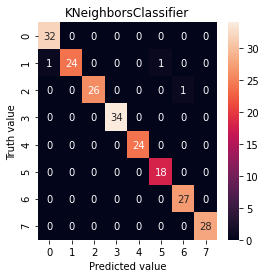

In [61]:
#get index of classifier with highest accuracy
index = mean_accuracy_scores[ mean_accuracy_scores['Test_mean_accuracy'] == max(mean_accuracy_scores['Test_mean_accuracy'])].index[0]

# predict the test data using the classifier with highest accuracy
y_predicted = classifier[index].predict(X_test)

# calculate accuracy of the classifier
accuracy = accuracy_score(y_test, y_predicted)
print("Accuracy on test data: ", accuracy)

# plot confusion matrix
print('\nConfusion matrix:')
plot_confusion_matrix(y_test, y_predicted, classifier[index].__class__.__name__)

##### K-neareast classifier was used to classify the mice into eight subclasses with an accuracy of 0.986 on the test data set